# Spaceborne-Ground Radar Calibration (Application) 

In this tutorial, we demonstrate how to exploit GPM-API along with other radar software such
[xradar](https://docs.openradarscience.org/projects/xradar/en/stable/) and 
[wradlib](https://docs.wradlib.org/en/latest/) to match reflectivities measurements of spaceborne (SR) and ground (GR) radars and assess the GR calibration bias.

Please read the [Spaceborne-Ground Radar Matching Tutorial](
https://gpm-api.readthedocs.io/en/latest/tutorials/tutorial_03_SR_GR_Matching.html) for a step-by-step guide through the process of obtaining spatially and temporally coincident radar samples.

## Relevant software

To run this tutorial, it is necessary to install additional libraries which are not automatically required by GPM-API.
The libraries are 
[xradar](https://docs.openradarscience.org/projects/xradar/en/stable/), 
[wradlib](https://docs.wradlib.org/en/latest/), 
[geopandas](https://geopandas.org/en/stable/), 
[fsspec](https://filesystem-spec.readthedocs.io/en/latest/), 
[s3fs](https://s3fs.readthedocs.io/en/latest/) and 
[folium](https://python-visualization.github.io/folium/latest/). 
You can install them with terminal command `conda install -c conda-forge xradar wradlib geopandas fsspec s3fs folium`

If you have such libraries installed, you can start importing the required packages:

In [ ]:
import warnings

warnings.filterwarnings("ignore")

from functools import reduce

import fsspec
import matplotlib.pyplot as plt
import numpy as np
import xradar as xd
from IPython.display import display

from gpm.utils.gv import volume_matching

np.set_printoptions(suppress=True)

## Read GR data 

In this tutorial, we use a coincident GPM DPR/NEXRAD overpass over San Diego (USA) during the landfall of Tropical Storm Hilary in 2023. 
Let's load the GR scanning volume of interest from the AWS S3 bucket.

In [ ]:
filepath = "noaa-nexrad-level2/2023/08/20/KNKX/KNKX20230820_221341_V06"
file = fsspec.open_local(
    f"simplecache::s3://{filepath}",
    s3={"anon": True},
    filecache={"cache_storage": "."},
)
dt_gr = xd.io.open_nexradlevel2_datatree(file)

Now, let's select the GR sweep to match with GPM DPR.

In [ ]:
sweep_idx = 0
sweep_group = f"sweep_{sweep_idx}"  # GR sweep (elevation to be used)
ds_gr = dt_gr[sweep_group].ds

## Define SR/GR volume matching settings

In [ ]:
radar_band = "S"
beamwidth_gr = 1
z_min_threshold_gr = 0
z_min_threshold_sr = 10

## Run SR/GR volume matching
The SR/GR volume matching routine typically takes around 40-50 seconds to complete. It returns a `geopandas.DataFrame` with the matched aggregated reflectivities and the associated statistics.

Note that the SR reflectivites measurements are provided by the `ZFactorFinal`and `ZFactorMeasured` variables. 
- The `ZFactorMeasured` variable contains the reflectivity measurements with sidelobe clutter removed. However, it still includes ground clutter, background noise, and is not corrected for atmospheric and hydrometeors attenuation.
- The `ZFactorFinal` represents the reflectivity measurements with background noise, ground clutter, and sidelobe clutter removed. The reflectivites have been corrected atmospheric and hydrometeors attenuation.

'scan_mode' has not been specified. Default to FS.


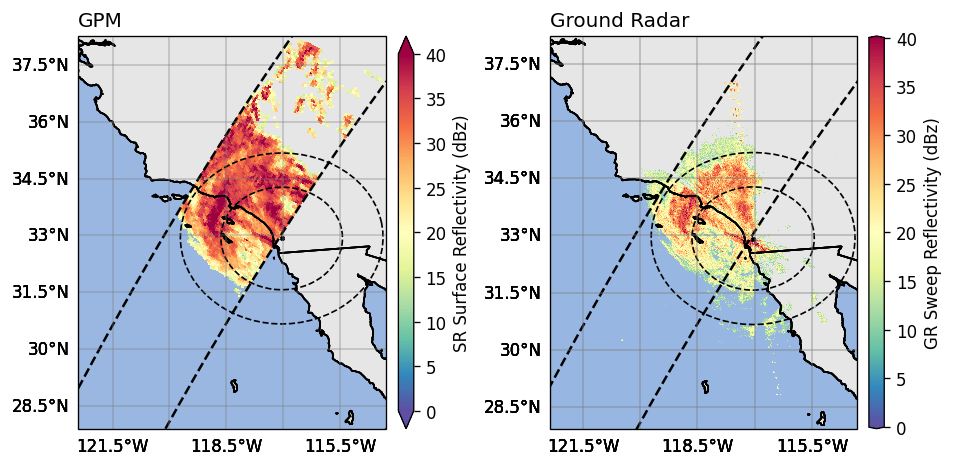

SR/GR Matching Elapsed time: 0:00:50.451024 .


In [ ]:
gdf_match = volume_matching(
    ds_gr=ds_gr,
    radar_band=radar_band,
    beamwidth_gr=beamwidth_gr,
    z_min_threshold_gr=z_min_threshold_gr,
    z_min_threshold_sr=z_min_threshold_sr,
    min_gr_range=0,
    max_gr_range=150_000,
    # gr_sensitivity_thresholds=None,
    # sr_sensitivity_thresholds=None,
    download_sr=False,  # require internet connection !
    display_quicklook=True,
)
# Note: The circle radius in the quicklook represents the min_gr_range, max_gr_range and 250_000 m range distances.

In [ ]:
display(gdf_match)

,GR_Z_mean,GR_Z_std,GR_Z_max,GR_Z_min,GR_Z_range,GR_Z_cov,GR_time,GR_gate_volume_sum,GR_fraction_covered_area,GR_counts,...,sweep_fixed_angle,along_track,cross_track,VolumeRatio,VolumeDiff,time_difference,GR_z_lower_bound,GR_z_upper_bound,SR_z_lower_bound,SR_z_upper_bound
0,15.221830,2.218835,19.5,10.5,9.0,0.145767,2023-08-20 22:13:43.619000064,1.325220e+09,0.523921,50.0,...,0.483398,98,42,44.668064,5.786978e+10,0 days 00:01:37.619000064,1535.796701,4204.951593,1654.094116,4209.583984
1,13.581805,1.941147,18.5,10.0,8.5,0.142923,2023-08-20 22:13:43.513999872,1.316104e+09,0.792108,73.0,...,0.483398,98,43,47.688195,6.144654e+10,0 days 00:01:37.513999872,1514.601481,4200.459785,1558.925415,4227.430664
2,16.550807,3.090479,23.0,10.0,13.0,0.186727,2023-08-20 22:13:43.414000128,1.304555e+09,0.966467,92.0,...,0.483398,98,44,46.511517,5.937226e+10,0 days 00:01:37.414000128,1494.739411,4194.752350,1605.041138,4143.421875
3,19.808129,3.660031,26.0,11.0,15.0,0.184774,2023-08-20 22:13:43.315000064,1.292233e+09,1.000000,98.0,...,0.483398,98,45,47.599161,6.021699e+10,0 days 00:01:37.315000064,1475.392380,4182.133888,1527.083740,4056.250488
4,18.983302,3.406269,24.5,10.0,14.5,0.179435,2023-08-20 22:13:43.212000000,1.280453e+09,1.000000,98.0,...,0.483398,98,46,48.697237,6.107406e+10,0 days 00:01:37.212000,1468.574285,4156.773245,1571.319336,4090.862549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1300,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-20 22:13:51.476000000,NaN,0.994502,96.0,...,0.483398,157,45,NaN,NaN,0 days 00:01:04.476000,NaN,NaN,1537.145386,4186.728516
1301,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-20 22:13:51.652999936,NaN,1.000000,99.0,...,0.483398,157,46,NaN,NaN,0 days 00:01:04.652999936,NaN,NaN,1580.786865,4100.309082
1302,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-20 22:13:51.756000000,NaN,1.000000,99.0,...,0.483398,157,47,NaN,NaN,0 days 00:01:04.756000,NaN,NaN,1527.273315,4036.591797
1303,NaN,NaN,NaN,NaN,NaN,NaN,2023-08-20 22:13:51.886000128,NaN,1.000000,104.0,...,0.483398,157,48,NaN,NaN,0 days 00:01:04.886000128,NaN,NaN,1469.200317,4086.919434


## Display SR/GR Database Fields 

Now let's compare the SR and GR reflectivities, without restrictive filtering criteria.

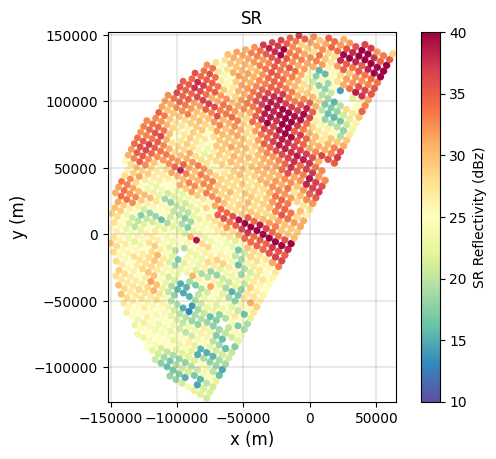

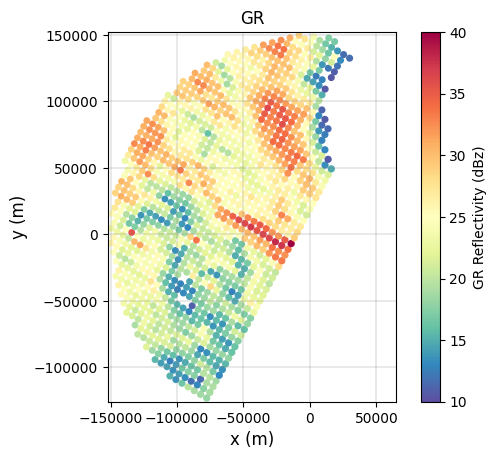

In [ ]:
extent_xy = gdf_match.total_bounds[[0, 2, 1, 3]]
p = gdf_match.plot(
    column=f"SR_zFactorFinal_{radar_band}_mean",
    legend=True,
    legend_kwds={"label": "SR Reflectivity (dBz)"},
    cmap="Spectral_r",
    vmin=10,
    vmax=40,
)
p.axes.set_xlim(extent_xy[0:2])
p.axes.set_ylim(extent_xy[2:4])
p.axes.set_title("SR")
plt.xlabel("x (m)", fontsize=12)
plt.ylabel("y (m)", fontsize=12)
plt.grid(lw=0.25, color="grey")

p = gdf_match.plot(
    column="GR_Z_mean",
    legend=True,
    legend_kwds={"label": "GR Reflectivity (dBz)"},
    cmap="Spectral_r",
    vmin=10,
    vmax=40,
)
p.axes.set_xlim(extent_xy[0:2])
p.axes.set_ylim(extent_xy[2:4])
p.axes.set_title("GR")
plt.xlabel("x (m)", fontsize=12)
plt.ylabel("y (m)", fontsize=12)
plt.grid(lw=0.25, color="grey")

Here we show how to explore interactively the reflectivity fields using Folium:

In [ ]:
gdf_match1 = gdf_match.copy()
gdf_match1 = gdf_match1.drop(columns="time_difference")  # to avoid bug with timedelta JSON serializer in folium
gdf_match1.explore(column="GR_Z_mean", legend=True, cmap="Spectral_r", vmin=0, vmax=40)

## Filter the SR/GR Database

When calibrating or comparing SR and GR data, there is a necessary tradeoff between the strictness of filtering criteria filtering and the number of available samples. Here below we provide some general recommendations for effective filtering:

1. **Sensitivity Thresholds**: Retain only those radar beams where the aggregated gate reflectivities exceed the instrument sensitivities.
The `GR_Z_fraction_above_<thr>dBZ` and `SR_zFactorFinal_Ku_fraction_above_<thr>dBZ` variables can be used filter the samples.

2. **Stratiform Precipitation**:  If the purpose of your analysis is to assess the calibration bias of GR data, it is suggested to focus on stratiform precipitation that ocurrs outside the melting layer (i.e. avoiding the bright band). Only stratiform samples above the melting layer are used in ground validation of the GPM DPR (W. Petersen 2017, personal communication).
Convective SR footprints are typically excluded to avoid dealing with:
- the high spatial variability in the precipitation field and issues with non-uniform beam filling (NUBF),
- the potential biases introduced by the SR attenuation correction,
- the potential biases in GR reflectivities, especially at C and X band, due to beam attenuation,
- the multiple scattering signature caused by hail particles.

5. **Reflectivity Range**: According to Warren et al. (2018), volume-averaged SR and GR reflectivity values should be selected within the range of 24 to 36 dBZ. This range minimizes the impact of low SR sensitivity,  SR beam attenuation and non-rayleigh scattering effects.
 
7. **Clutter Removal**: Exclude SR/GR samples that are contaminated by ground clutter, anomalous propagation, or beam blockage. 

8. **Volume matching**: Exclude SR/GR samples where there are excessive differences in the total gate volume.

In [ ]:
# Define mask
masks = [
    # Select SR scan with "normal" dataQuality (for entire cross-track scan)
    gdf_match["SR_dataQuality"] == 0,
    # Select SR beams with detected precipitation
    gdf_match["SR_flagPrecip"] > 0,
    # Select only 'high quality' SR data
    # - qualityFlag == 1 indicates low quality retrievals
    # - qualityFlag == 2 indicates bad/missing retrievals
    gdf_match["SR_qualityFlag"] == 0,
    # Select SR beams with SR above minimum reflectivity
    gdf_match["SR_zFactorFinal_Ku_fraction_above_12dBZ"] > 0.95,
    # Select SR beams with GR above minimum reflectivity
    gdf_match["GR_Z_fraction_above_10dBZ"] > 0.95,
    # Select only SR beams with detected bright band
    gdf_match["SR_qualityBB"] == 1,
    # Select only beams with confident precipitation type
    gdf_match["SR_qualityTypePrecip"] == 1,
    # Select only stratiform precipitation
    # - SR_flagPrecipitationType == 2 indicates convective
    gdf_match["SR_flagPrecipitationType"] == 1,
    # Select only SR beams with reliable attenuation correction
    gdf_match["SR_reliabFlag"].isin((1, 2)),  # or == 1
    # Select only beams with reduced path attenuation
    # gdf_match["SR_zFactorCorrection_Ku_max"]
    # gdf_match["SR_piaFinal"]
    # gdf_match["SR_pathAtten"]
    # Select only SR beams with matching SR gates with no clutter
    gdf_match["SR_fraction_clutter"] == 0,
    # Select only SR beams with matching SR gates not in the melting layer
    gdf_match["SR_fraction_melting_layer"] == 0,
    # Select only SR beams with matching SR gates with precipitation
    gdf_match["SR_fraction_no_precip"] == 0,
    # Select only SR beams with matching SR gates with no hail
    # gdf_match["SR_fraction_hail"] == 0,
    # Select only SR beams with matching SR gates with rain
    # gdf_match["SR_fraction_hail"] == 1,
    # Select only SR beams with matching SR gates with snow
    # gdf_match["SR_fraction_snow"] == 1,
    # Discard SR beams with high NUBF
    # gdf_match["SR_zFactorFinal_Ku_range"] > 5,
    # gdf_match["SR_zFactorFinal_Ku_cov"] < 0.5,
    # gdf_match["GR_Z_cov"] < 0.5,
    # gdf_match["GR_Z_range"] > 5,
    # Select only interval of reflectivities
    # - Warren et al., 2018:  between 24 and 36 dBZ
    # (gdf_match["SR_zFactorFinal_Ku_mean"] > 24) & (gdf_match["SR_zFactorFinal_Ku_mean"] < 36),
    # (gdf_match["GR_Z_mean"] > 24) & (gdf_match["GR_Z_mean"] < 36),
    # Select SR beams only within given GR radius interval
    # (gdf_match["GR_range_min"] > min_gr_range) & (gdf_match["GR_range_max"] < max_gr_range),
    # Discard SR beams where scanning time difference > 5 minutes
    gdf_match["time_difference"] < np.timedelta64(5, "m"),
    # Discard SR beams where GR gates does not cover 80% of the horizontal area
    # gdf_match["GR_fraction_covered_area"] > 0.8,
    # Filter footprints where volume ratio exceeds 60
    # gdf_match["VolumeRatio"] > 60,
    # Filter footprints where GR affected by beam blockage
    # TODO: Filtering by beam blockage
]

In [ ]:
# Define final mask
mask_final = reduce(np.logical_and, masks)

<Axes: >

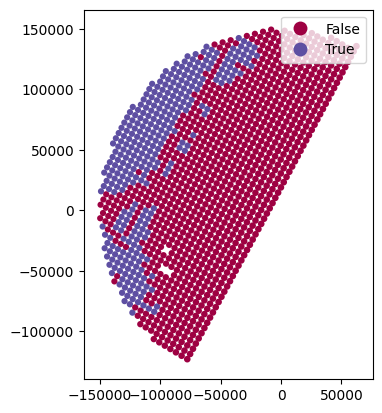

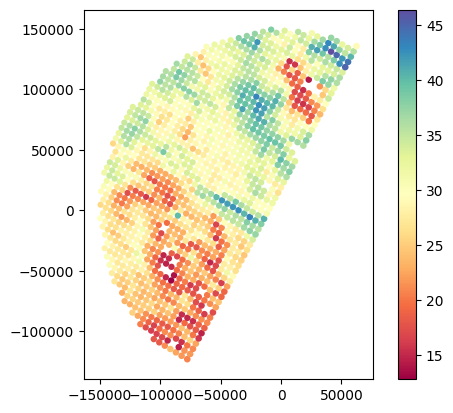

In [ ]:
# Dsplay final filtering mask
gdf_match["filtering_mask"] = mask_final
gdf_match.plot(column="filtering_mask", legend=True, cmap="Spectral")
gdf_match.plot(column="SR_zFactorFinal_Ku_mean", legend=True, cmap="Spectral")

In [ ]:
# Filter matching dataset
gdf_final = gdf_match[mask_final]

<Axes: >

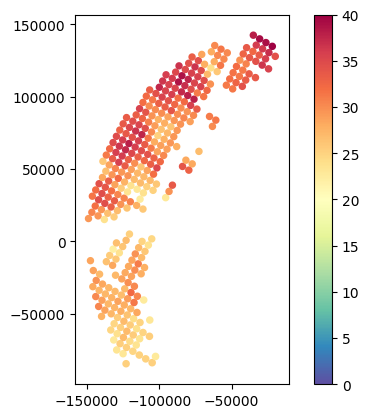

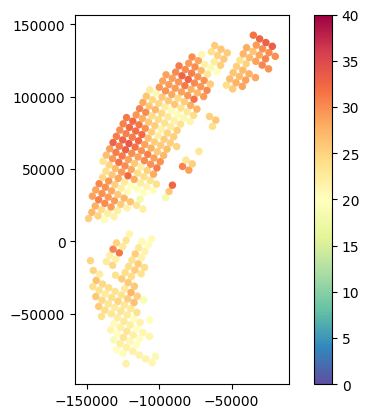

In [ ]:
# Plot results
gdf_final.plot(column="SR_zFactorFinal_Ku_mean", legend=True, cmap="Spectral_r", vmin=0, vmax=40)
gdf_final.plot(column="GR_Z_mean", legend=True, cmap="Spectral_r", vmin=0, vmax=40)

## Determine GR Calibration Bias

In [ ]:
# Determine offset
gdf_match["DIFF_Z_SR_GR"] = gdf_match["SR_zFactorFinal_Ku_mean"] - gdf_match["GR_Z_mean"]
gdf_match["DIFF_Z_GR_SR"] = gdf_match["GR_Z_mean"] - gdf_match["SR_zFactorFinal_Ku_mean"]

# Compute statistics
bias = np.nanmean(gdf_match["DIFF_Z_GR_SR"]).round(2)
robBias = np.nanmedian(gdf_match["DIFF_Z_GR_SR"]).round(2)

# R2 (pearson, spearman rank)
print(f"Th ZH Calibration offset is (mean): {bias} dB")
print(f"Th ZH Calibration offset is (median): {robBias} dB")

Th ZH Calibration offset is (mean): -4.96 dB
Th ZH Calibration offset is (median): -4.46 dB


In [ ]:
# Comparison of GR vs SR reflectivities
hue_variable = "VolumeDiff"
hue_title = "Difference in volume between SR and GR [m³]"

Text(0.5, 0.98, 'GR vs SR')

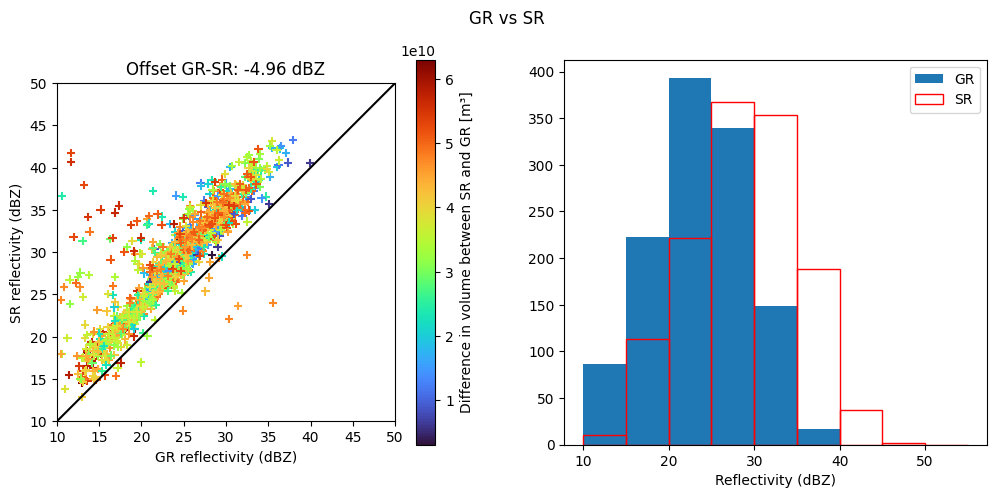

In [ ]:
# - Histograms
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(121, aspect="equal")
plt.scatter(
    gdf_match["GR_Z_mean"],
    gdf_match["SR_zFactorFinal_Ku_mean"],
    marker="+",
    c=gdf_match[hue_variable],
    cmap="turbo",
)
plt.colorbar(label=hue_title)
plt.plot([0, 60], [0, 60], linestyle="solid", color="black")
plt.xlim(10, 50)
plt.ylim(10, 50)
plt.xlabel("GR reflectivity (dBZ)")
plt.ylabel("SR reflectivity (dBZ)")
plt.title(f"Offset GR-SR: {bias} dBZ")
ax = fig.add_subplot(122)
plt.hist(
    gdf_match["GR_Z_mean"][gdf_match["GR_Z_mean"] > z_min_threshold_gr],
    bins=np.arange(10, 60, 5),
    edgecolor="None",
    label="GR",
)
plt.hist(
    gdf_match["SR_zFactorFinal_Ku_mean"][gdf_match["SR_zFactorFinal_Ku_mean"] > z_min_threshold_sr],
    bins=np.arange(10, 60, 5),
    edgecolor="red",
    facecolor="None",
    label="SR",
)
plt.xlabel("Reflectivity (dBZ)")
plt.legend()
fig.suptitle("GR vs SR")

## References

- [Cao, Q., Y. Hong, Y. Qi, Y. Wen, J. Zhang, J. J. Gourley, and L. Liao, 2013: Empirical conversion of the vertical profile of reflectivity from Ku-band to S-band frequency. J. Geophys. Res. Atmos., 118, 1814–1825, https://doi.org/10.1002/jgrd.50138](https://doi.org/10.1002/jgrd.50138)
- [Schwaller, MR, and Morris, KR. 2011. A ground validation network for the Global Precipitation Measurement mission. J. Atmos. Oceanic Technol., 28, 301-319.28, https://doi.org/10.1175/2010JTECHA1403.1](https://doi.org/10.1175/2010JTECHA1403.1)
- [Warren, R.A., A. Protat, S.T. Siems, H.A. Ramsay, V. Louf, M.J. Manton, and T.A. Kane, 2018. Calibrating ground-based radars against TRMM and GPM. J. Atmos. Oceanic Technol., 35, 323–346, https://doi.org/10.1175/JTECH-D-17-0128.1](https://doi.org/10.1175/JTECH-D-17-0128.1)

## Citation

This notebook is part of the [GPM-API  documentation](https://gpm-api.readthedocs.io/).

Large portions of this tutorials were adapted and derived from an old $\omega radlib$  tutorial.

Copyright: $\omega radlib$  and GPM-API developers.
Distributed under the MIT License. See [GPM-API license](https://github.com/ghiggi/gpm_api/blob/main/LICENSE) for more info.